# AgroScan — Jalon 4 : expérience segmentation PlantDoc

Objectif : tester si supprimer ou neutraliser le fond aide le modèle à mieux généraliser sur les images terrain PlantDoc.

Ce notebook ne remplace pas `jalon4_mixte_training.ipynb`. Il s'agit d'une expérience séparée qui s'appuie sur le modèle sauvegardé du jalon 4 quand il est disponible.

Protocole :
1. Segmenter `PlantDoc train/test` avec `rembg` et stocker un cache local.
2. Inspecter visuellement les images originales et segmentées.
3. Évaluer le modèle jalon 4 sur PlantDoc original puis segmenté.
4. Fine-tuner une copie du modèle sur PlantDoc segmenté.
5. Réévaluer et comparer les métriques.

Le cache segmenté est écrit dans `data/segmented/`, donc il n'est pas destiné à être versionné.

## 1. Lancement

Utiliser le même lancement que les autres notebooks si vous êtes sur Linux avec GPU TensorFlow :

```bash
./scripts/tf_gpu_env.sh jupyter lab
```

Si `rembg` n'est pas installé, relancer l'installation des dépendances :

```bash
pip install -r requirements.txt
```

Au premier appel, `rembg` peut télécharger son modèle de segmentation.

In [1]:
import json
import os
import shutil
import subprocess
import time
from pathlib import Path
from difflib import SequenceMatcher

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageOps

import cv2
import tensorflow as tf
import tensorflow_datasets as tfds
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

try:
    from rembg import remove, new_session
except ImportError as exc:
    raise ImportError(
        "La dépendance rembg est manquante. Installer avec `pip install -r requirements.txt`, "
        "puis redémarrer le kernel."
    ) from exc

print('TensorFlow:', tf.__version__)
print('GPU:', tf.config.list_physical_devices('GPU'))

I0000 00:00:1780163916.737959   20273 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1780163917.288885   20273 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


TensorFlow: 2.21.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


W0000 00:00:1780163918.236774   20273 gpu_device.cc:2459] TensorFlow was not built with CUDA kernel binaries compatible with compute capability 12.0a. CUDA kernels will be jit-compiled from PTX, which could take 30 minutes or longer.


## 2. Configuration

In [16]:
# Détection robuste de la racine projet
_env_root = Path(os.environ['AGROSCAN_ROOT']) if 'AGROSCAN_ROOT' in os.environ else None
IS_COLAB = Path('/content').exists() and Path('/opt/google').exists()
_cwd = Path('.').resolve()
try:
    _starting_dir = Path(get_ipython().starting_dir).resolve()
except (NameError, AttributeError):
    _starting_dir = _cwd

_candidates = list(dict.fromkeys(filter(None, [
    _env_root, _cwd, _starting_dir, *_cwd.parents, *_starting_dir.parents,
])))
ROOT = next((p for p in _candidates if (p / 'requirements.txt').exists()), _env_root or _cwd)

DATA_DIR = ROOT / 'data'
MODEL_DIR = ROOT / 'models'
REPORT_DIR = ROOT / 'reports'
SEGMENTED_DIR = DATA_DIR / 'segmented'
SEGMENTED_PLANTDOC_DIR = SEGMENTED_DIR / 'plantdoc_rembg_crop_gray'
SEGMENTATION_REPORT_DIR = REPORT_DIR / 'segmentation'

for directory in [REPORT_DIR, SEGMENTATION_REPORT_DIR, SEGMENTED_PLANTDOC_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42
AUTOTUNE = tf.data.AUTOTUNE

# Paramètres de segmentation
SEG_MODEL = 'isnet-general-use'  # plus robuste que u2net sur des images réelles variées
KEEP_COMPONENTS = 3             # utile quand l'image contient plusieurs feuilles
SEGMENTATION_MASK_MODE = 'rembg_green_fallback'  # 'rembg', 'rembg_green_fallback' ou 'rembg_green_union'
MASK_MIN_AREA_RATIO = 0.05      # en dessous, on garde l'image originale pour éviter une segmentation destructive
MASK_DILATE_ITER = 1
GREEN_MASK_MIN_SATURATION = 28
GREEN_MASK_EXCESS_THRESHOLD = 22
GREEN_MASK_DOMINANCE = 1.05
GREEN_FALLBACK_REMBG_MAX_AREA_RATIO = 0.15  # on ajoute le vert seulement si rembg garde trop peu de pixels
GREEN_FALLBACK_MAX_AREA_RATIO = 0.30        # si le masque hybride est trop large, on évite l'union complète
GREEN_FALLBACK_TAKE_GREEN_MIN_AREA_RATIO = 0.35  # cas feuille proche : prendre le masque vert seul
GREEN_FALLBACK_TAKE_GREEN_MAX_AREA_RATIO = 0.90  # éviter de prendre toute l'image si le fond est végétal
BACKGROUND_COLOR = (235, 235, 235)
CROP_TO_MASK = True
CROP_PADDING_RATIO = 0.12
FORCE_RESEGMENT = True

# Mode calibration : petit échantillon varié avant segmentation complète
CALIBRATION_IMAGES_PER_CLASS = 2
CALIBRATION_MAX_CLASSES = None  # None = toutes les classes PlantDoc évaluables
CALIBRATION_FORCE_RESEGMENT = True
CALIBRATION_DIR = SEGMENTED_DIR / 'calibration_plantdoc_rembg_crop_gray'

# Fine-tuning sur images segmentées
SEG_EPOCHS = 20
SEG_LR = 1e-5
SEG_PATIENCE = 4
UNFREEZE_RATIO_SEG = 0.75

# Fine-tuning robuste : mélange PlantDoc original + PlantDoc segmenté
MIXED_SEG_ORIG_EPOCHS = 20
MIXED_SEG_ORIG_LR = 1e-5
MIXED_SEG_ORIG_PATIENCE = 4
MIXED_ORIGINAL_RATIO = 0.50
MIXED_SEGMENTED_RATIO = 0.50

tf.keras.utils.set_random_seed(SEED)
print('Racine projet:', ROOT)
print('Cache segmentation:', SEGMENTED_PLANTDOC_DIR)

Racine projet: /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan
Cache segmentation: /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/data/segmented/plantdoc_rembg_crop_gray


## 3. Chargement PlantVillage et mapping PlantDoc

On conserve les labels PlantVillage comme espace de sortie, comme dans les autres notebooks.

In [3]:
(_, _, pv_test_raw), info = tfds.load(
    'plant_village',
    split=['train[:70%]', 'train[70%:85%]', 'train[85%:]'],
    as_supervised=True,
    with_info=True,
    data_dir=str(DATA_DIR / 'tfds'),
)

class_names = info.features['label'].names
num_classes = len(class_names)
pv_label_to_idx = {name: idx for idx, name in enumerate(class_names)}

PLANTDOC_DIR = DATA_DIR / 'plantdoc'
PLANTDOC_TRAIN_DIR = PLANTDOC_DIR / 'train'
PLANTDOC_TEST_DIR = PLANTDOC_DIR / 'test'

plantdoc_to_plantvillage = {
    'Apple Scab Leaf':                       'Apple___Apple_scab',
    'Apple leaf':                            'Apple___healthy',
    'Apple rust leaf':                       'Apple___Cedar_apple_rust',
    'Bell_pepper leaf':                      'Pepper,_bell___healthy',
    'Bell_pepper leaf spot':                 'Pepper,_bell___Bacterial_spot',
    'Blueberry leaf':                        'Blueberry___healthy',
    'Cherry leaf':                           'Cherry___healthy',
    'Corn Gray leaf spot':                   'Corn___Cercospora_leaf_spot Gray_leaf_spot',
    'Corn leaf blight':                      'Corn___Northern_Leaf_Blight',
    'Corn rust leaf':                        'Corn___Common_rust',
    'Peach leaf':                            'Peach___healthy',
    'Potato leaf early blight':              'Potato___Early_blight',
    'Potato leaf late blight':               'Potato___Late_blight',
    'Raspberry leaf':                        'Raspberry___healthy',
    'Soyabean leaf':                         'Soybean___healthy',
    'Squash Powdery mildew leaf':            'Squash___Powdery_mildew',
    'Strawberry leaf':                       'Strawberry___healthy',
    'Tomato Early blight leaf':              'Tomato___Early_blight',
    'Tomato Septoria leaf spot':             'Tomato___Septoria_leaf_spot',
    'Tomato leaf':                           'Tomato___healthy',
    'Tomato leaf bacterial spot':            'Tomato___Bacterial_spot',
    'Tomato leaf late blight':               'Tomato___Late_blight',
    'Tomato leaf mosaic virus':              'Tomato___Tomato_mosaic_virus',
    'Tomato leaf yellow virus':              'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    'Tomato mold leaf':                      'Tomato___Leaf_Mold',
    'Tomato two spotted spider mites leaf':  'Tomato___Spider_mites Two-spotted_spider_mite',
    'grape leaf':                            'Grape___healthy',
    'grape leaf black rot':                  'Grape___Black_rot',
}

if not PLANTDOC_TEST_DIR.exists():
    raise FileNotFoundError('PlantDoc est introuvable. Attendu : data/plantdoc/train et data/plantdoc/test')

plantdoc_classes = sorted(p.name for p in PLANTDOC_TEST_DIR.iterdir() if p.is_dir())
valid_pd_mapping = {
    k: v for k, v in plantdoc_to_plantvillage.items()
    if k in plantdoc_classes and v in class_names
}

print(f'PlantVillage : {num_classes} classes')
print(f'PlantDoc test : {len(plantdoc_classes)} classes | {len(valid_pd_mapping)} évaluables')

W0000 00:00:1780163918.308455   20273 gpu_device.cc:2459] TensorFlow was not built with CUDA kernel binaries compatible with compute capability 12.0a. CUDA kernels will be jit-compiled from PTX, which could take 30 minutes or longer.


PlantVillage : 38 classes
PlantDoc test : 27 classes | 27 évaluables


## 4. Segmentation avec rembg

`rembg` retourne un masque de premier plan. On nettoie ensuite ce masque avec OpenCV : fermeture/ouverture morphologique, conservation des principales composantes, légère dilatation, puis crop autour du masque.

La sortie choisie ici est `crop + fond gris clair`, pour éviter un fond noir trop artificiel.

In [4]:
IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.webp'}
seg_session = new_session(SEG_MODEL)


def list_images(root):
    return sorted(p for p in root.rglob('*') if p.is_file() and p.suffix.lower() in IMAGE_EXTS)



def make_green_leaf_mask(image_rgb):
    """Masque couleur simple pour récupérer les feuilles ratées par rembg.

    Ce masque est volontairement permissif : il sert de filet de sécurité quand rembg
    garde seulement les fruits, les tiges ou les lésions très contrastées.
    """
    img = np.asarray(image_rgb).astype(np.float32)
    r, g, b = img[..., 0], img[..., 1], img[..., 2]
    excess_green = 2 * g - r - b
    green_dominant = (g > r * GREEN_MASK_DOMINANCE) & (g > b * GREEN_MASK_DOMINANCE)
    saturated = (img.max(axis=-1) - img.min(axis=-1)) > GREEN_MASK_MIN_SATURATION
    mask = ((excess_green > GREEN_MASK_EXCESS_THRESHOLD) | green_dominant) & saturated
    return mask.astype(np.uint8) * 255


def build_leaf_mask(image_rgb, rembg_mask_uint8):
    rembg_mask = (rembg_mask_uint8 > 20).astype(np.uint8) * 255
    rembg_area = float((rembg_mask > 0).mean())

    if SEGMENTATION_MASK_MODE == 'rembg':
        return rembg_mask

    green_mask = make_green_leaf_mask(image_rgb)
    green_area = float((green_mask > 0).mean())
    hybrid_mask = np.maximum(rembg_mask, green_mask)
    hybrid_area = float((hybrid_mask > 0).mean())

    if SEGMENTATION_MASK_MODE == 'rembg_green_union':
        return hybrid_mask

    if SEGMENTATION_MASK_MODE == 'rembg_green_fallback':
        # On ajoute le masque vert seulement quand rembg semble avoir raté la feuille.
        if rembg_area <= GREEN_FALLBACK_REMBG_MAX_AREA_RATIO:
            if hybrid_area <= GREEN_FALLBACK_MAX_AREA_RATIO:
                return hybrid_mask
            # Cas fréquent sur feuilles proches, surtout maïs : rembg garde les lésions,
            # mais le masque vert couvre la feuille. On prend le vert seul s'il reste plausible.
            if GREEN_FALLBACK_TAKE_GREEN_MIN_AREA_RATIO <= green_area <= GREEN_FALLBACK_TAKE_GREEN_MAX_AREA_RATIO:
                return green_mask
        return rembg_mask

    raise ValueError(f'Mode de masque inconnu : {SEGMENTATION_MASK_MODE}')

def clean_mask(mask_uint8, keep_components=3):
    mask = (mask_uint8 > 20).astype(np.uint8) * 255
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

    n_labels, labels, stats, _ = cv2.connectedComponentsWithStats((mask > 0).astype(np.uint8), connectivity=8)
    if n_labels <= 1:
        return mask

    component_ids = list(range(1, n_labels))
    component_ids.sort(key=lambda i: stats[i, cv2.CC_STAT_AREA], reverse=True)
    selected = component_ids[:keep_components]
    cleaned = np.isin(labels, selected).astype(np.uint8) * 255

    if MASK_DILATE_ITER > 0:
        cleaned = cv2.dilate(cleaned, kernel, iterations=MASK_DILATE_ITER)
    return cleaned


def crop_box_from_mask(mask_uint8, padding_ratio=0.08):
    ys, xs = np.where(mask_uint8 > 0)
    if len(xs) == 0 or len(ys) == 0:
        return None
    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()
    h, w = mask_uint8.shape
    pad = int(max(x2 - x1 + 1, y2 - y1 + 1) * padding_ratio)
    x1 = max(0, x1 - pad)
    y1 = max(0, y1 - pad)
    x2 = min(w - 1, x2 + pad)
    y2 = min(h - 1, y2 + pad)
    return (x1, y1, x2 + 1, y2 + 1)


def segment_image(src_path, dst_path):
    # Corrige l'orientation EXIF avant le calcul du masque. Sans ça, certaines images
    # portrait produisent un masque transposé par rapport à l'image RGB.
    image = ImageOps.exif_transpose(Image.open(src_path)).convert('RGB')
    mask_pil = remove(image, session=seg_session, only_mask=True, post_process_mask=True)
    mask = np.array(mask_pil.convert('L'))
    mask = build_leaf_mask(image, mask)
    mask = clean_mask(mask, keep_components=KEEP_COMPONENTS)

    area_ratio = float((mask > 0).mean())
    status = 'ok'
    if area_ratio < MASK_MIN_AREA_RATIO:
        status = 'mask_too_small_original_kept'
        out = image.copy()
        box = None
    else:
        bg = Image.new('RGB', image.size, BACKGROUND_COLOR)
        out = Image.composite(image, bg, Image.fromarray(mask))
        box = crop_box_from_mask(mask, CROP_PADDING_RATIO) if CROP_TO_MASK else None
        if box is not None:
            out = out.crop(box)

    out = out.resize(IMG_SIZE, Image.Resampling.BILINEAR)
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    out.save(dst_path, quality=95)

    return {
        'src': str(src_path),
        'dst': str(dst_path),
        'mask_area_ratio': area_ratio,
        'status': status,
        'crop_box': box,
    }


def segment_split(src_root, dst_root, force=False):
    rows = []
    images = list_images(src_root)
    print(f'{src_root.name}: {len(images)} images à traiter')
    t0 = time.time()
    for i, src in enumerate(images, start=1):
        rel = src.relative_to(src_root)
        dst = dst_root / rel.with_suffix('.jpg')
        if dst.exists() and not force:
            rows.append({'src': str(src), 'dst': str(dst), 'mask_area_ratio': np.nan, 'status': 'cached', 'crop_box': None})
            continue
        try:
            rows.append(segment_image(src, dst))
        except Exception as exc:
            rows.append({'src': str(src), 'dst': str(dst), 'mask_area_ratio': np.nan, 'status': f'error: {exc}', 'crop_box': None})
        if i % 100 == 0 or i == len(images):
            print(f'  {i:>5}/{len(images)} images — {time.time() - t0:.0f}s')
    return pd.DataFrame(rows)

## 5. Calibration sur petit échantillon

Avant de segmenter tout PlantDoc, on teste les paramètres sur un petit échantillon stratifié : quelques images par classe, prises dans `train` et `test`. Le but est d'inspecter rapidement si les feuilles sont bien conservées, si les symptômes restent visibles, et si le crop n'est pas trop agressif.

Si le rendu est mauvais, modifier les paramètres de la section 2 (`SEGMENTATION_MASK_MODE`, `SEG_MODEL`, `KEEP_COMPONENTS`, `BACKGROUND_COLOR`, `CROP_TO_MASK`, `CROP_PADDING_RATIO`, etc.), puis relancer cette section seulement.


In [5]:
def sample_plantdoc_images_by_class(split_root, mapping, images_per_class=2, max_classes=None):
    rows = []
    class_items = list(mapping.items())
    if max_classes is not None:
        class_items = class_items[:max_classes]

    for pd_cls, pv_cls in class_items:
        cls_dir = split_root / pd_cls
        if not cls_dir.exists():
            continue
        images = sorted(p for p in cls_dir.iterdir() if p.is_file() and p.suffix.lower() in IMAGE_EXTS)
        if not images:
            continue
        # Sélection régulière dans la classe pour éviter de prendre uniquement les premières images du dossier.
        idxs = np.linspace(0, len(images) - 1, num=min(images_per_class, len(images)), dtype=int)
        for idx in idxs:
            rows.append({'split': split_root.name, 'pd_class': pd_cls, 'pv_class': pv_cls, 'src': images[int(idx)]})
    return pd.DataFrame(rows)


def segment_sample_dataframe(sample_df, dst_root, force=True):
    rows = []
    dst_root.mkdir(parents=True, exist_ok=True)
    print(f'Échantillon calibration : {len(sample_df)} images')
    t0 = time.time()
    for i, row in sample_df.reset_index(drop=True).iterrows():
        src = Path(row['src'])
        dst = dst_root / row['split'] / row['pd_class'] / src.with_suffix('.jpg').name
        if dst.exists() and not force:
            result = {'src': str(src), 'dst': str(dst), 'mask_area_ratio': np.nan, 'status': 'cached', 'crop_box': None}
        else:
            result = segment_image(src, dst)
        result.update({'split': row['split'], 'pd_class': row['pd_class'], 'pv_class': row['pv_class']})
        rows.append(result)
        print(f"  {i + 1:>3}/{len(sample_df)} — {row['split']} — {row['pd_class']} — {result['status']}")
    print(f'Terminé en {time.time() - t0:.0f}s')
    return pd.DataFrame(rows)


calib_train_df = sample_plantdoc_images_by_class(
    PLANTDOC_TRAIN_DIR, valid_pd_mapping,
    images_per_class=CALIBRATION_IMAGES_PER_CLASS,
    max_classes=CALIBRATION_MAX_CLASSES,
)
calib_test_df = sample_plantdoc_images_by_class(
    PLANTDOC_TEST_DIR, valid_pd_mapping,
    images_per_class=CALIBRATION_IMAGES_PER_CLASS,
    max_classes=CALIBRATION_MAX_CLASSES,
)
calibration_sample_df = pd.concat([calib_train_df, calib_test_df], ignore_index=True)
display(calibration_sample_df.groupby(['split', 'pd_class']).size().reset_index(name='n').head(20))
print(f'Total calibration : {len(calibration_sample_df)} images')


,split,pd_class,n
0,test,Apple Scab Leaf,2
1,test,Apple leaf,2
2,test,Apple rust leaf,2
3,test,Bell_pepper leaf,2
4,test,Bell_pepper leaf spot,2
5,test,Blueberry leaf,2
6,test,Cherry leaf,2
7,test,Corn Gray leaf spot,2
8,test,Corn leaf blight,2
9,test,Corn rust leaf,2


Total calibration : 108 images


In [6]:
calibration_report = segment_sample_dataframe(
    calibration_sample_df,
    CALIBRATION_DIR,
    force=CALIBRATION_FORCE_RESEGMENT,
)
calibration_report.to_csv(SEGMENTATION_REPORT_DIR / 'plantdoc_segmentation_calibration_report.csv', index=False)
display(calibration_report.groupby(['split', 'status']).size().reset_index(name='n'))


Échantillon calibration : 108 images
    1/108 — train — Apple Scab Leaf — ok
    2/108 — train — Apple Scab Leaf — ok
    3/108 — train — Apple leaf — ok
    4/108 — train — Apple leaf — ok
    5/108 — train — Apple rust leaf — mask_too_small_original_kept
    6/108 — train — Apple rust leaf — ok
    7/108 — train — Bell_pepper leaf — ok
    8/108 — train — Bell_pepper leaf — ok
    9/108 — train — Bell_pepper leaf spot — ok
   10/108 — train — Bell_pepper leaf spot — ok
   11/108 — train — Blueberry leaf — ok
   12/108 — train — Blueberry leaf — ok
   13/108 — train — Cherry leaf — ok
   14/108 — train — Cherry leaf — ok
   15/108 — train — Corn Gray leaf spot — ok
   16/108 — train — Corn Gray leaf spot — ok
   17/108 — train — Corn leaf blight — ok
   18/108 — train — Corn leaf blight — ok
   19/108 — train — Corn rust leaf — ok
   20/108 — train — Corn rust leaf — ok
   21/108 — train — Peach leaf — ok
   22/108 — train — Peach leaf — ok
   23/108 — train — Potato leaf early bligh

,split,status,n
0,test,mask_too_small_original_kept,1
1,test,ok,53
2,train,mask_too_small_original_kept,4
3,train,ok,50


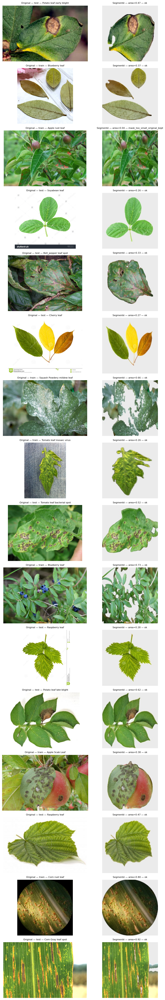

In [7]:
plot_df = calibration_report[calibration_report['status'].isin(['ok', 'cached', 'mask_too_small_original_kept'])].copy()
plot_df = plot_df.sample(n=min(16, len(plot_df)), random_state=SEED)

fig, axes = plt.subplots(len(plot_df), 2, figsize=(9, 3 * len(plot_df)))
if len(plot_df) == 1:
    axes = np.array([axes])

for row_idx, (_, row) in enumerate(plot_df.iterrows()):
    src = Path(row['src'])
    dst = Path(row['dst'])
    axes[row_idx, 0].imshow(Image.open(src).convert('RGB'))
    axes[row_idx, 0].set_title(f"Original — {row['split']} — {row['pd_class']}", fontsize=8)
    axes[row_idx, 0].axis('off')

    axes[row_idx, 1].imshow(Image.open(dst).convert('RGB'))
    axes[row_idx, 1].set_title(
        f"Segmenté — area={row['mask_area_ratio']:.2f} — {row['status']}",
        fontsize=8,
    )
    axes[row_idx, 1].axis('off')

plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'plantdoc_segmentation_calibration_examples.png', dpi=120)
plt.show()


## 6. Génération du cache PlantDoc segmenté complet

Cette cellule peut prendre quelques minutes. Elle est relançable : les images déjà segmentées sont réutilisées sauf si `FORCE_RESEGMENT=True`.

In [8]:
seg_train_dir = SEGMENTED_PLANTDOC_DIR / 'train'
seg_test_dir = SEGMENTED_PLANTDOC_DIR / 'test'

train_seg_report = segment_split(PLANTDOC_TRAIN_DIR, seg_train_dir, force=FORCE_RESEGMENT)
test_seg_report = segment_split(PLANTDOC_TEST_DIR, seg_test_dir, force=FORCE_RESEGMENT)

seg_report = pd.concat([
    train_seg_report.assign(split='train'),
    test_seg_report.assign(split='test'),
], ignore_index=True)
seg_report.to_csv(SEGMENTATION_REPORT_DIR / 'plantdoc_segmentation_report.csv', index=False)

summary = seg_report.groupby(['split', 'status']).size().reset_index(name='n')
display(summary)
print('Rapport sauvegardé :', SEGMENTATION_REPORT_DIR / 'plantdoc_segmentation_report.csv')

train: 2342 images à traiter
    100/2342 images — 41s
    200/2342 images — 76s
    300/2342 images — 116s
    400/2342 images — 156s
    500/2342 images — 199s
    600/2342 images — 233s
    700/2342 images — 273s
    800/2342 images — 310s
    900/2342 images — 353s
   1000/2342 images — 390s
   1100/2342 images — 427s
   1200/2342 images — 462s
   1300/2342 images — 506s
   1400/2342 images — 550s
   1500/2342 images — 593s
   1600/2342 images — 630s
   1700/2342 images — 661s
   1800/2342 images — 700s
   1900/2342 images — 742s
   2000/2342 images — 782s
   2100/2342 images — 819s
   2200/2342 images — 859s
   2300/2342 images — 908s
   2342/2342 images — 925s
test: 236 images à traiter
    100/236 images — 46s
    200/236 images — 86s
    236/236 images — 99s


,split,status,n
0,test,mask_too_small_original_kept,15
1,test,ok,221
2,train,mask_too_small_original_kept,176
3,train,ok,2166


Rapport sauvegardé : /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/reports/segmentation/plantdoc_segmentation_report.csv


## 7. Inspection visuelle avant/après du dataset complet

À regarder avant de lancer le fine-tuning. Si beaucoup d'images sont mal segmentées, il vaut mieux ne pas tirer de conclusion sur les métriques.

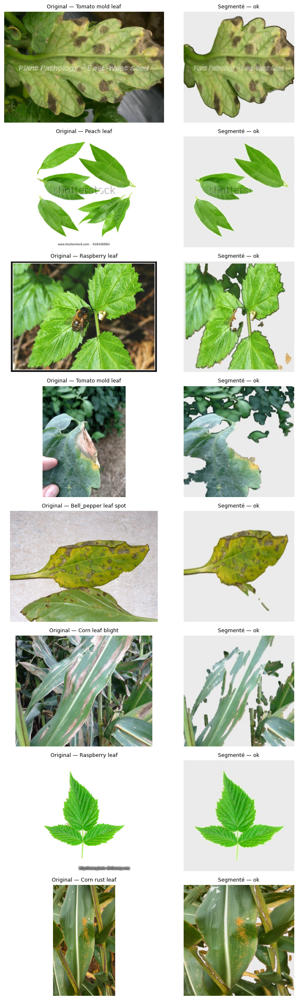

In [9]:
rng = np.random.default_rng(SEED)
sample_rows = seg_report[seg_report['status'].isin(['ok', 'cached'])].sample(
    n=min(8, len(seg_report)), random_state=SEED
)

fig, axes = plt.subplots(len(sample_rows), 2, figsize=(8, 3 * len(sample_rows)))
if len(sample_rows) == 1:
    axes = np.array([axes])

for row_idx, (_, row) in enumerate(sample_rows.iterrows()):
    src = Path(row['src'])
    dst = Path(row['dst'])
    axes[row_idx, 0].imshow(Image.open(src).convert('RGB'))
    axes[row_idx, 0].set_title(f'Original — {src.parent.name}', fontsize=9)
    axes[row_idx, 0].axis('off')

    axes[row_idx, 1].imshow(Image.open(dst).convert('RGB'))
    axes[row_idx, 1].set_title(f'Segmenté — {row["status"]}', fontsize=9)
    axes[row_idx, 1].axis('off')

plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'plantdoc_segmentation_examples.png', dpi=120)
plt.show()

## 8. Datasets segmentés et modèle jalon 4

Le notebook cherche d'abord le checkpoint final du jalon 4.

In [10]:
MODEL_CANDIDATES = [
    MODEL_DIR / 'agroscan_jalon4.keras',
]
model_path = next((p for p in MODEL_CANDIDATES if p.exists()), None)
if model_path is None:
    raise FileNotFoundError(
        'Aucun modèle jalon 4 trouvé. Attendu par exemple : models/jalon4_phase3.keras. '
        'Lancer d’abord jalon4_mixte_training.ipynb.'
    )

model = tf.keras.models.load_model(model_path, compile=False)
print('Modèle chargé :', model_path)


def collect_plantdoc_paths(split_dir, mapping):
    paths, labels, classes = [], [], []
    for pd_cls, pv_cls in mapping.items():
        cls_dir = split_dir / pd_cls
        if not cls_dir.exists() or pv_cls not in pv_label_to_idx:
            continue
        label = pv_label_to_idx[pv_cls]
        for p in sorted(cls_dir.iterdir()):
            if p.is_file() and p.suffix.lower() in IMAGE_EXTS:
                paths.append(str(p))
                labels.append(label)
                classes.append(pd_cls)
    return paths, np.array(labels, dtype=np.int64), classes

orig_test_paths, y_test_orig, _ = collect_plantdoc_paths(PLANTDOC_TEST_DIR, valid_pd_mapping)
seg_test_paths, y_test_seg, _ = collect_plantdoc_paths(seg_test_dir, valid_pd_mapping)
seg_train_paths, y_train_seg, _ = collect_plantdoc_paths(seg_train_dir, valid_pd_mapping)

rng = np.random.default_rng(SEED)
perm = rng.permutation(len(seg_train_paths))
seg_train_paths = [seg_train_paths[i] for i in perm]
y_train_seg = y_train_seg[perm]

n_val = int(0.2 * len(seg_train_paths))
seg_val_paths, y_val_seg = seg_train_paths[:n_val], y_train_seg[:n_val]
seg_ft_paths, y_ft_seg = seg_train_paths[n_val:], y_train_seg[n_val:]

print(f'PlantDoc original test : {len(orig_test_paths)} images')
print(f'PlantDoc segmenté test : {len(seg_test_paths)} images')
print(f'PlantDoc segmenté FT   : {len(seg_ft_paths)} train | {len(seg_val_paths)} val')

Modèle chargé : /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/models/agroscan_jalon4.keras
PlantDoc original test : 236 images
PlantDoc segmenté test : 236 images
PlantDoc segmenté FT   : 1872 train | 468 val


In [11]:
data_augmentation_seg = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical', seed=SEED),
    tf.keras.layers.RandomRotation(0.20, seed=SEED),
    tf.keras.layers.RandomZoom((-0.25, 0.10), seed=SEED),
    tf.keras.layers.RandomContrast(0.25, seed=SEED),
    tf.keras.layers.RandomBrightness(0.15, seed=SEED),
], name='data_augmentation_segmented')


def load_image_for_model(path, label, augment=False):
    raw = tf.io.read_file(path)
    img = tf.image.decode_image(raw, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    if augment:
        img = data_augmentation_seg(img, training=True)
    return img, label


def make_path_ds(paths, labels, shuffle=False, augment=False):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels.astype(np.int64)))
    if shuffle:
        ds = ds.shuffle(min(len(paths), 4096), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(lambda p, l: load_image_for_model(p, l, augment=augment), num_parallel_calls=AUTOTUNE)
    return ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)

orig_test_ds = make_path_ds(orig_test_paths, y_test_orig)
seg_test_ds = make_path_ds(seg_test_paths, y_test_seg)
seg_train_ds = make_path_ds(seg_ft_paths, y_ft_seg, shuffle=True, augment=True)
seg_val_ds = make_path_ds(seg_val_paths, y_val_seg)

## 9. Évaluation : modèle jalon 4 sur original vs segmenté

Cette étape vérifie si le modèle existant supporte déjà les images segmentées. Une baisse forte ici est normale : le modèle n'a pas forcément été entraîné avec ce type de rendu.

In [12]:
def predict_dataset(model, ds):
    y_true, y_pred, conf = [], [], []
    for images, labels in ds:
        probs = model.predict(images, verbose=0)
        y_true.extend(labels.numpy().tolist())
        y_pred.extend(np.argmax(probs, axis=1).tolist())
        conf.extend(np.max(probs, axis=1).tolist())
    return np.array(y_true), np.array(y_pred), np.array(conf)


def metrics_from_predictions(y_true, y_pred, conf):
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'macro_f1': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'mean_confidence': float(np.mean(conf)),
        'n_images': int(len(y_true)),
    }

orig_true, orig_pred, orig_conf = predict_dataset(model, orig_test_ds)
seg_true, seg_pred, seg_conf = predict_dataset(model, seg_test_ds)

compare_before_ft = pd.DataFrame([
    {'setting': 'jalon4_model_on_original_plantdoc', **metrics_from_predictions(orig_true, orig_pred, orig_conf)},
    {'setting': 'jalon4_model_on_segmented_plantdoc', **metrics_from_predictions(seg_true, seg_pred, seg_conf)},
])
display(compare_before_ft)
compare_before_ft.to_csv(SEGMENTATION_REPORT_DIR / 'segmentation_eval_before_finetune.csv', index=False)

E0000 00:00:1780164992.560500   20430 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1780164996.619614   20430 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


,setting,accuracy,macro_f1,mean_confidence,n_images
0,jalon4_model_on_original_plantdoc,0.444915,0.421992,0.583473,236
1,jalon4_model_on_segmented_plantdoc,0.444915,0.420967,0.551680,236


## 10. Fine-tuning sur PlantDoc segmenté

On fine-tune une copie du modèle jalon 4 avec un learning rate très faible. Ce test répond à la vraie question : le modèle peut-il apprendre mieux sur une représentation où le fond est neutralisé ?

Backbone : 117/157 couches gelées, 40 dégelées
Epoch 1/20
55/59 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.4167 - loss: 1.9555

E0000 00:00:1780165008.132243   20427 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.4176 - loss: 1.9556

E0000 00:00:1780165014.584787   20428 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


59/59 ━━━━━━━━━━━━━━━━━━━━ 18s 197ms/step - accuracy: 0.4300 - loss: 1.9527 - val_accuracy: 0.3953 - val_loss: 2.0868 - learning_rate: 1.0000e-05
Epoch 2/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4434 - loss: 1.8766 - val_accuracy: 0.4231 - val_loss: 2.0131 - learning_rate: 1.0000e-05
Epoch 3/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4519 - loss: 1.8113 - val_accuracy: 0.4402 - val_loss: 1.9553 - learning_rate: 1.0000e-05
Epoch 4/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4583 - loss: 1.8029 - val_accuracy: 0.4444 - val_loss: 1.9119 - learning_rate: 1.0000e-05
Epoch 5/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4514 - loss: 1.8123 - val_accuracy: 0.4530 - val_loss: 1.8747 - learning_rate: 1.0000e-05
Epoch 6/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4573 - loss: 1.7503 - val_accuracy: 0.4551 - val_loss: 1.8457 - learning_rate: 1.0000e-05
Epoch 7/20
59/59 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4728 - loss: 1

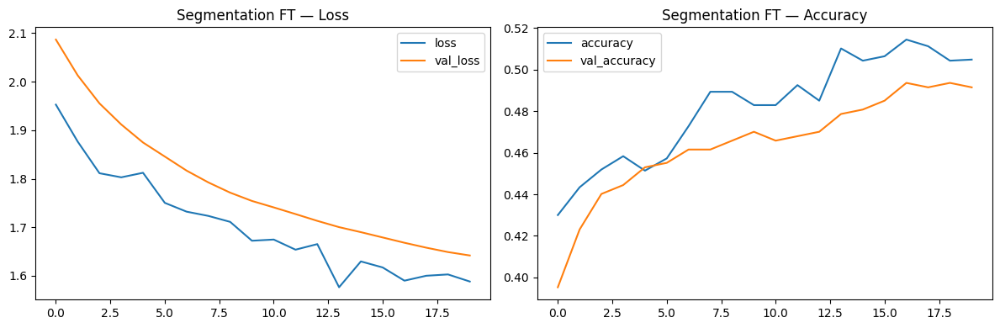

Meilleur checkpoint : /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/models/jalon4_segmented_plantdoc_ft.keras


In [13]:
seg_model = tf.keras.models.load_model(model_path, compile=False)

# Dégel prudent du dernier quart du backbone si on retrouve MobileNetV3 dans le modèle.
backbone = None
for layer in seg_model.layers:
    if isinstance(layer, tf.keras.Model) and 'MobileNet' in layer.name:
        backbone = layer
        break
if backbone is None and len(seg_model.layers) > 1 and isinstance(seg_model.layers[1], tf.keras.Model):
    backbone = seg_model.layers[1]

if backbone is not None:
    n_layers = len(backbone.layers)
    freeze_until = int(UNFREEZE_RATIO_SEG * n_layers)
    backbone.trainable = True
    for layer in backbone.layers[:freeze_until]:
        layer.trainable = False
    for layer in backbone.layers[freeze_until:]:
        layer.trainable = True
    print(f'Backbone : {freeze_until}/{n_layers} couches gelées, {n_layers - freeze_until} dégelées')
else:
    print('Backbone non identifié : fine-tuning de toutes les couches déjà entraînables du modèle chargé.')

seg_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=SEG_LR),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

ckpt_seg = MODEL_DIR / 'jalon4_segmented_plantdoc_ft.keras'
callbacks_seg = [
    tf.keras.callbacks.ModelCheckpoint(str(ckpt_seg), monitor='val_accuracy', save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=SEG_PATIENCE, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1),
]

history_seg = seg_model.fit(
    seg_train_ds,
    validation_data=seg_val_ds,
    epochs=SEG_EPOCHS,
    callbacks=callbacks_seg,
)

history_seg_df = pd.DataFrame(history_seg.history)
history_seg_df.to_csv(SEGMENTATION_REPORT_DIR / 'segmented_finetune_history.csv', index=False)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
history_seg_df[['loss', 'val_loss']].plot(ax=axes[0], title='Segmentation FT — Loss')
history_seg_df[['accuracy', 'val_accuracy']].plot(ax=axes[1], title='Segmentation FT — Accuracy')
plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'segmented_finetune_curves.png', dpi=120)
plt.show()
print('Meilleur checkpoint :', ckpt_seg)

## 11. Évaluation finale et interprétation

,setting,accuracy,macro_f1,mean_confidence,n_images
0,jalon4_model_on_original_plantdoc,0.444915,0.421992,0.583473,236
1,jalon4_model_on_segmented_plantdoc,0.444915,0.420967,0.551680,236
2,segmented_finetuned_model_on_segmented_plantdoc,0.521186,0.501829,0.564929,236


Rapport classification — modèle segmenté fine-tuné sur PlantDoc segmenté
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.80      0.40      0.53        10
                  Apple___Cedar_apple_rust       0.45      0.50      0.48        10
                           Apple___healthy       0.38      0.89      0.53         9
                       Blueberry___healthy       0.60      0.55      0.57        11
                          Cherry___healthy       0.33      0.10      0.15        10
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.17      0.25      0.20         4
                        Corn___Common_rust       0.80      0.80      0.80        10
               Corn___Northern_Leaf_Blight       0.57      0.67      0.62        12
                         Grape___Black_rot       0.67      0.50      0.57         8
                           Grape___healthy       0.79      0.92      0.85        12
  

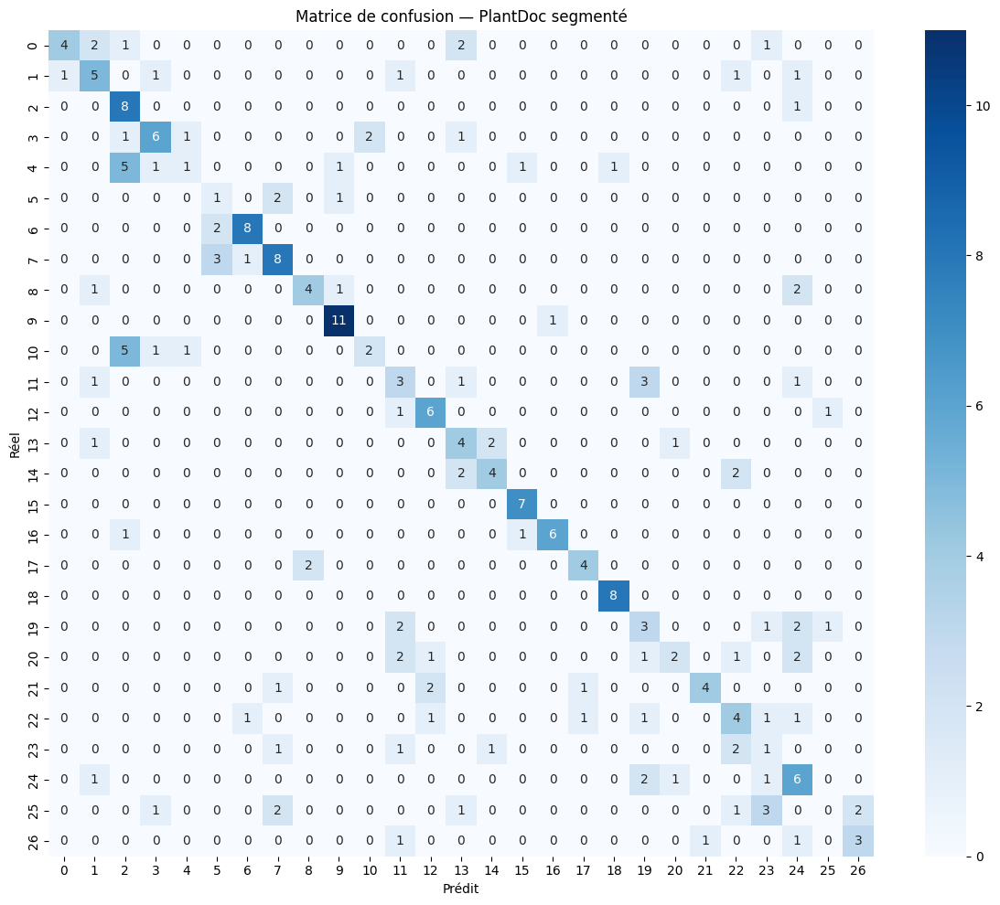

In [14]:
final_true, final_pred, final_conf = predict_dataset(seg_model, seg_test_ds)

segmentation_results = pd.DataFrame([
    {'setting': 'jalon4_model_on_original_plantdoc', **metrics_from_predictions(orig_true, orig_pred, orig_conf)},
    {'setting': 'jalon4_model_on_segmented_plantdoc', **metrics_from_predictions(seg_true, seg_pred, seg_conf)},
    {'setting': 'segmented_finetuned_model_on_segmented_plantdoc', **metrics_from_predictions(final_true, final_pred, final_conf)},
])

display(segmentation_results)
segmentation_results.to_csv(SEGMENTATION_REPORT_DIR / 'segmentation_final_results.csv', index=False)
with open(SEGMENTATION_REPORT_DIR / 'segmentation_final_results.json', 'w') as f:
    json.dump(segmentation_results.to_dict(orient='records'), f, indent=2)

print('Rapport classification — modèle segmenté fine-tuné sur PlantDoc segmenté')
print(classification_report(
    [class_names[i] for i in final_true],
    [class_names[i] for i in final_pred],
    zero_division=0,
))

labels_sorted = sorted(set(final_true.tolist()))
cm = confusion_matrix(final_true, final_pred, labels=labels_sorted)
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax)
ax.set_title('Matrice de confusion — PlantDoc segmenté')
ax.set_xlabel('Prédit')
ax.set_ylabel('Réel')
plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'segmented_plantdoc_confusion_matrix.png', dpi=120)
plt.show()

## 12. Fine-tuning mixte original + segmenté

Le fine-tuning uniquement sur images segmentées améliore PlantDoc segmenté, mais il peut rendre le modèle dépendant de ce rendu. Cette variante entraîne une copie du modèle jalon 4 avec deux vues du même domaine : PlantDoc original et PlantDoc segmenté. L'objectif est d'obtenir un modèle plus robuste si la segmentation mobile est imparfaite ou absente.


In [17]:
def segmented_path_to_original(seg_path):
    seg_path = Path(seg_path)
    rel = seg_path.relative_to(seg_train_dir)
    original_dir = PLANTDOC_TRAIN_DIR / rel.parent
    candidates = sorted(original_dir.glob(rel.stem + '.*'))
    if candidates:
        return str(candidates[0])
    # Fallback : certains noms contiennent déjà plusieurs extensions ou caractères spéciaux.
    for p in original_dir.iterdir():
        if p.is_file() and p.stem == rel.stem:
            return str(p)
    raise FileNotFoundError(f'Image originale introuvable pour {seg_path}')


orig_ft_paths = [segmented_path_to_original(p) for p in seg_ft_paths]
orig_val_paths = [segmented_path_to_original(p) for p in seg_val_paths]

orig_train_mixed_ds = (
    tf.data.Dataset.from_tensor_slices((orig_ft_paths, y_ft_seg.astype(np.int64)))
    .shuffle(min(len(orig_ft_paths), 4096), seed=SEED, reshuffle_each_iteration=True)
    .map(lambda p, l: load_image_for_model(p, l, augment=True), num_parallel_calls=AUTOTUNE)
    .repeat()
)
seg_train_mixed_ds = (
    tf.data.Dataset.from_tensor_slices((seg_ft_paths, y_ft_seg.astype(np.int64)))
    .shuffle(min(len(seg_ft_paths), 4096), seed=SEED + 1, reshuffle_each_iteration=True)
    .map(lambda p, l: load_image_for_model(p, l, augment=True), num_parallel_calls=AUTOTUNE)
    .repeat()
)

mixed_train_ds = (
    tf.data.Dataset.sample_from_datasets(
        [orig_train_mixed_ds, seg_train_mixed_ds],
        weights=[MIXED_ORIGINAL_RATIO, MIXED_SEGMENTED_RATIO],
        seed=SEED,
    )
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# Validation mixte déterministe : original + segmenté, non répétée.
mixed_val_paths = orig_val_paths + seg_val_paths
mixed_val_labels = np.concatenate([y_val_seg, y_val_seg]).astype(np.int64)
mixed_val_ds = make_path_ds(mixed_val_paths, mixed_val_labels)

steps_per_epoch_mixed = max(1, len(seg_ft_paths) // BATCH_SIZE)
print(f'Mixed train : {len(orig_ft_paths)} originaux + {len(seg_ft_paths)} segmentés')
print(f'Mixed val   : {len(orig_val_paths)} originaux + {len(seg_val_paths)} segmentés')
print(f'steps/epoch : {steps_per_epoch_mixed}')


Mixed train : 1872 originaux + 1872 segmentés
Mixed val   : 468 originaux + 468 segmentés
steps/epoch : 58


Backbone : 117/157 couches gelées, 40 dégelées
Epoch 1/20
57/58 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4732 - loss: 1.7689

E0000 00:00:1780165545.392738   20428 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


58/58 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - accuracy: 0.4650 - loss: 1.7309 - val_accuracy: 0.4573 - val_loss: 1.8336 - learning_rate: 1.0000e-05
Epoch 2/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.4822 - loss: 1.7313 - val_accuracy: 0.4679 - val_loss: 1.7960 - learning_rate: 1.0000e-05
Epoch 3/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.4784 - loss: 1.6468 - val_accuracy: 0.4808 - val_loss: 1.7614 - learning_rate: 1.0000e-05
Epoch 4/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.4704 - loss: 1.7037 - val_accuracy: 0.4818 - val_loss: 1.7381 - learning_rate: 1.0000e-05
Epoch 5/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.4930 - loss: 1.6583 - val_accuracy: 0.4872 - val_loss: 1.7167 - learning_rate: 1.0000e-05
Epoch 6/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.4887 - loss: 1.6500 - val_accuracy: 0.4850 - val_loss: 1.6996 - learning_rate: 1.0000e-05
Epoch 7/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.5054 - loss: 1

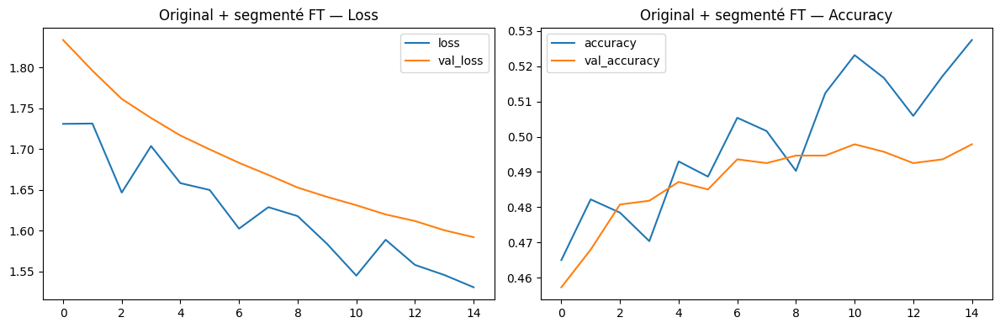

Meilleur checkpoint : /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/models/jalon4_original_segmented_plantdoc_ft.keras


In [18]:
mixed_model = tf.keras.models.load_model(model_path, compile=False)

backbone = None
for layer in mixed_model.layers:
    if isinstance(layer, tf.keras.Model) and 'MobileNet' in layer.name:
        backbone = layer
        break
if backbone is None and len(mixed_model.layers) > 1 and isinstance(mixed_model.layers[1], tf.keras.Model):
    backbone = mixed_model.layers[1]

if backbone is not None:
    n_layers = len(backbone.layers)
    freeze_until = int(UNFREEZE_RATIO_SEG * n_layers)
    backbone.trainable = True
    for layer in backbone.layers[:freeze_until]:
        layer.trainable = False
    for layer in backbone.layers[freeze_until:]:
        layer.trainable = True
    print(f'Backbone : {freeze_until}/{n_layers} couches gelées, {n_layers - freeze_until} dégelées')

mixed_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=MIXED_SEG_ORIG_LR),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'],
)

ckpt_mixed = MODEL_DIR / 'jalon4_original_segmented_plantdoc_ft.keras'
callbacks_mixed = [
    tf.keras.callbacks.ModelCheckpoint(str(ckpt_mixed), monitor='val_accuracy', save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=MIXED_SEG_ORIG_PATIENCE, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-7, verbose=1),
]

history_mixed = mixed_model.fit(
    mixed_train_ds,
    validation_data=mixed_val_ds,
    epochs=MIXED_SEG_ORIG_EPOCHS,
    steps_per_epoch=steps_per_epoch_mixed,
    callbacks=callbacks_mixed,
)

history_mixed_df = pd.DataFrame(history_mixed.history)
history_mixed_df.to_csv(SEGMENTATION_REPORT_DIR / 'original_segmented_finetune_history.csv', index=False)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
history_mixed_df[['loss', 'val_loss']].plot(ax=axes[0], title='Original + segmenté FT — Loss')
history_mixed_df[['accuracy', 'val_accuracy']].plot(ax=axes[1], title='Original + segmenté FT — Accuracy')
plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'original_segmented_finetune_curves.png', dpi=120)
plt.show()
print('Meilleur checkpoint :', ckpt_mixed)


## 13. Évaluation du modèle mixte

On évalue le modèle mixte sur les deux rendus : PlantDoc original et PlantDoc segmenté. Le résultat important est le compromis : améliorer les images segmentées sans perdre complètement les images originales.


In [20]:
mixed_orig_true, mixed_orig_pred, mixed_orig_conf = predict_dataset(mixed_model, orig_test_ds)
mixed_seg_true, mixed_seg_pred, mixed_seg_conf = predict_dataset(mixed_model, seg_test_ds)

mixed_results = pd.DataFrame([
    {'setting': 'jalon4_model_on_original_plantdoc', **metrics_from_predictions(orig_true, orig_pred, orig_conf)},
    {'setting': 'jalon4_model_on_segmented_plantdoc', **metrics_from_predictions(seg_true, seg_pred, seg_conf)},
    {'setting': 'segmented_only_ft_on_segmented_plantdoc', **metrics_from_predictions(final_true, final_pred, final_conf)},
    {'setting': 'mixed_original_segmented_ft_on_original_plantdoc', **metrics_from_predictions(mixed_orig_true, mixed_orig_pred, mixed_orig_conf)},
    {'setting': 'mixed_original_segmented_ft_on_segmented_plantdoc', **metrics_from_predictions(mixed_seg_true, mixed_seg_pred, mixed_seg_conf)},
])
display(mixed_results)
mixed_results.to_csv(SEGMENTATION_REPORT_DIR / 'segmentation_mixed_final_results.csv', index=False)
with open(SEGMENTATION_REPORT_DIR / 'segmentation_mixed_final_results.json', 'w') as f:
    json.dump(mixed_results.to_dict(orient='records'), f, indent=2)

print('Rapport classification — modèle mixte sur PlantDoc original')
print(classification_report(
    [class_names[i] for i in mixed_orig_true],
    [class_names[i] for i in mixed_orig_pred],
    zero_division=0,
))

print('Rapport classification — modèle mixte sur PlantDoc segmenté')
print(classification_report(
    [class_names[i] for i in mixed_seg_true],
    [class_names[i] for i in mixed_seg_pred],
    zero_division=0,
))


,setting,accuracy,macro_f1,mean_confidence,n_images
0,jalon4_model_on_original_plantdoc,0.444915,0.421992,0.583473,236
1,jalon4_model_on_segmented_plantdoc,0.444915,0.420967,0.551680,236
2,segmented_only_ft_on_segmented_plantdoc,0.521186,0.501829,0.564929,236
3,mixed_original_segmented_ft_on_original_plantdoc,0.516949,0.501717,0.578753,236
4,mixed_original_segmented_ft_on_segmented_plantdoc,0.508475,0.452295,0.552116,236


Rapport classification — modèle mixte sur PlantDoc original
                                            precision    recall  f1-score   support

                        Apple___Apple_scab       0.75      0.30      0.43        10
                  Apple___Cedar_apple_rust       0.33      0.50      0.40        10
                           Apple___healthy       0.29      0.78      0.42         9
                       Blueberry___healthy       0.60      0.55      0.57        11
                          Cherry___healthy       0.50      0.40      0.44        10
Corn___Cercospora_leaf_spot Gray_leaf_spot       0.33      0.50      0.40         4
                        Corn___Common_rust       0.75      0.90      0.82        10
               Corn___Northern_Leaf_Blight       0.70      0.58      0.64        12
                         Grape___Black_rot       0.80      0.50      0.62         8
                           Grape___healthy       0.79      0.92      0.85        12
               

## 14. Vérification 1 — PlantVillage et PlantWild

On vérifie que le modèle mixte original + segmenté ne gagne pas uniquement sur PlantDoc au prix d'un oubli trop important des autres domaines. PlantVillage est évalué directement depuis TFDS. PlantWild est évalué si `data/plantwild/` est disponible dans la structure attendue.

In [21]:
def preprocess_tfds_for_model(image, label):
    image = tf.image.resize(image, IMG_SIZE)
    image = tf.cast(image, tf.float32)
    return image, label

pv_test_for_mixed_ds = (
    pv_test_raw
    .map(preprocess_tfds_for_model, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

pv_mixed_true, pv_mixed_pred, pv_mixed_conf = predict_dataset(mixed_model, pv_test_for_mixed_ds)
pv_mixed_metrics = metrics_from_predictions(pv_mixed_true, pv_mixed_pred, pv_mixed_conf)

print('PlantVillage test — modèle mixte original + segmenté')
print(f"Accuracy   : {pv_mixed_metrics['accuracy']*100:.2f} %")
print(f"Macro F1   : {pv_mixed_metrics['macro_f1']*100:.2f} %")
print(f"Confiance  : {pv_mixed_metrics['mean_confidence']*100:.2f} %")

E0000 00:00:1780167266.191524   20428 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


PlantVillage test — modèle mixte original + segmenté
Accuracy   : 62.91 %
Macro F1   : 54.06 %
Confiance  : 62.32 %


In [22]:
plantwild_to_plantvillage_check = {
    'apple scab': 'Apple___Apple_scab',
    'apple black rot': 'Apple___Black_rot',
    'apple rust': 'Apple___Cedar_apple_rust',
    'apple leaf': 'Apple___healthy',
    'blueberry leaf': 'Blueberry___healthy',
    'cherry leaf': 'Cherry___healthy',
    'cherry powdery mildew': 'Cherry___Powdery_mildew',
    'corn gray leaf spot': 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
    'corn leaf blight': 'Corn___Northern_Leaf_Blight',
    'corn rust': 'Corn___Common_rust',
    'corn leaf': 'Corn___healthy',
    'grape black rot': 'Grape___Black_rot',
    'grape esca': 'Grape___Esca_(Black_Measles)',
    'grape leaf blight': 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
    'grape leaf': 'Grape___healthy',
    'orange citrus greening': 'Orange___Haunglongbing_(Citrus_greening)',
    'orange haunglongbing': 'Orange___Haunglongbing_(Citrus_greening)',
    'peach bacterial spot': 'Peach___Bacterial_spot',
    'peach leaf': 'Peach___healthy',
    'bell pepper leaf spot': 'Pepper,_bell___Bacterial_spot',
    'bell pepper leaf': 'Pepper,_bell___healthy',
    'potato early blight': 'Potato___Early_blight',
    'potato late blight': 'Potato___Late_blight',
    'potato leaf': 'Potato___healthy',
    'raspberry leaf': 'Raspberry___healthy',
    'soybean leaf': 'Soybean___healthy',
    'squash powdery mildew': 'Squash___Powdery_mildew',
    'strawberry leaf scorch': 'Strawberry___Leaf_scorch',
    'strawberry leaf': 'Strawberry___healthy',
    'tomato bacterial spot': 'Tomato___Bacterial_spot',
    'tomato early blight': 'Tomato___Early_blight',
    'tomato late blight': 'Tomato___Late_blight',
    'tomato leaf mold': 'Tomato___Leaf_Mold',
    'tomato septoria leaf spot': 'Tomato___Septoria_leaf_spot',
    'tomato spider mites': 'Tomato___Spider_mites Two-spotted_spider_mite',
    'tomato target spot': 'Tomato___Target_Spot',
    'tomato yellow leaf curl virus': 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
    'tomato mosaic virus': 'Tomato___Tomato_mosaic_virus',
    'tomato leaf': 'Tomato___healthy',
}


def find_plantwild_eval_dir():
    root = DATA_DIR / 'plantwild'
    if not root.exists():
        return None
    candidates = [root, root / 'plantwild', *[p for p in root.iterdir() if p.is_dir()]]
    for candidate in candidates:
        for split_name in ['val', 'test', 'train']:
            split_dir = candidate / split_name
            if split_dir.exists():
                return split_dir
    return None


def collect_plantwild_eval_paths(split_dir):
    paths, labels = [], []
    for cls_dir in sorted(p for p in split_dir.iterdir() if p.is_dir()):
        pv_cls = plantwild_to_plantvillage_check.get(cls_dir.name.lower())
        if pv_cls is None or pv_cls not in pv_label_to_idx:
            continue
        label = pv_label_to_idx[pv_cls]
        for img_path in sorted(cls_dir.iterdir()):
            if img_path.is_file() and img_path.suffix.lower() in IMAGE_EXTS:
                paths.append(str(img_path))
                labels.append(label)
    return paths, np.array(labels, dtype=np.int64)

plantwild_eval_dir = find_plantwild_eval_dir()
if plantwild_eval_dir is None:
    print('PlantWild non trouvé : évaluation ignorée.')
    plantwild_mixed_metrics = None
else:
    pw_eval_paths, pw_eval_labels = collect_plantwild_eval_paths(plantwild_eval_dir)
    if len(pw_eval_paths) == 0:
        print('PlantWild trouvé, mais aucune classe mappée exploitable.')
        plantwild_mixed_metrics = None
    else:
        pw_eval_ds = make_path_ds(pw_eval_paths, pw_eval_labels)
        pw_mixed_true, pw_mixed_pred, pw_mixed_conf = predict_dataset(mixed_model, pw_eval_ds)
        plantwild_mixed_metrics = metrics_from_predictions(pw_mixed_true, pw_mixed_pred, pw_mixed_conf)
        print(f'PlantWild {plantwild_eval_dir.name} — {len(pw_eval_paths)} images')
        print(f"Accuracy   : {plantwild_mixed_metrics['accuracy']*100:.2f} %")
        print(f"Macro F1   : {plantwild_mixed_metrics['macro_f1']*100:.2f} %")
        print(f"Confiance  : {plantwild_mixed_metrics['mean_confidence']*100:.2f} %")

robustness_rows = [
    {'dataset': 'PlantVillage test', **pv_mixed_metrics},
]
if plantwild_mixed_metrics is not None:
    robustness_rows.append({'dataset': f'PlantWild {plantwild_eval_dir.name}', **plantwild_mixed_metrics})
robustness_df = pd.DataFrame(robustness_rows)
display(robustness_df)
robustness_df.to_csv(SEGMENTATION_REPORT_DIR / 'mixed_model_cross_domain_check.csv', index=False)

E0000 00:00:1780167269.790240   20425 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


PlantWild val — 674 images
Accuracy   : 44.36 %
Macro F1   : 39.14 %
Confiance  : 53.55 %


,dataset,accuracy,macro_f1,mean_confidence,n_images
0,PlantVillage test,0.629098,0.540606,0.623238,8145
1,PlantWild val,0.443620,0.391362,0.535524,674


## 15. Vérification 2 — Confusion regroupée par plante

PlantDoc contient plusieurs maladies par plante. Cette vue regroupe les prédictions par plante pour voir si le modèle confond surtout les maladies d'une même plante, ou s'il se trompe déjà sur la plante elle-même.

,n,plant_accuracy,class_accuracy
true_plant,,,
Tomato,69,0.710145,0.333333
Apple,29,0.724138,0.517241
Corn,26,1.000000,0.692308
Grape,20,0.800000,0.750000
"Pepper,_bell",17,0.647059,0.529412
Potato,16,0.687500,0.375000
Blueberry,11,0.545455,0.545455
Cherry,10,0.400000,0.400000
Peach,9,0.222222,0.222222


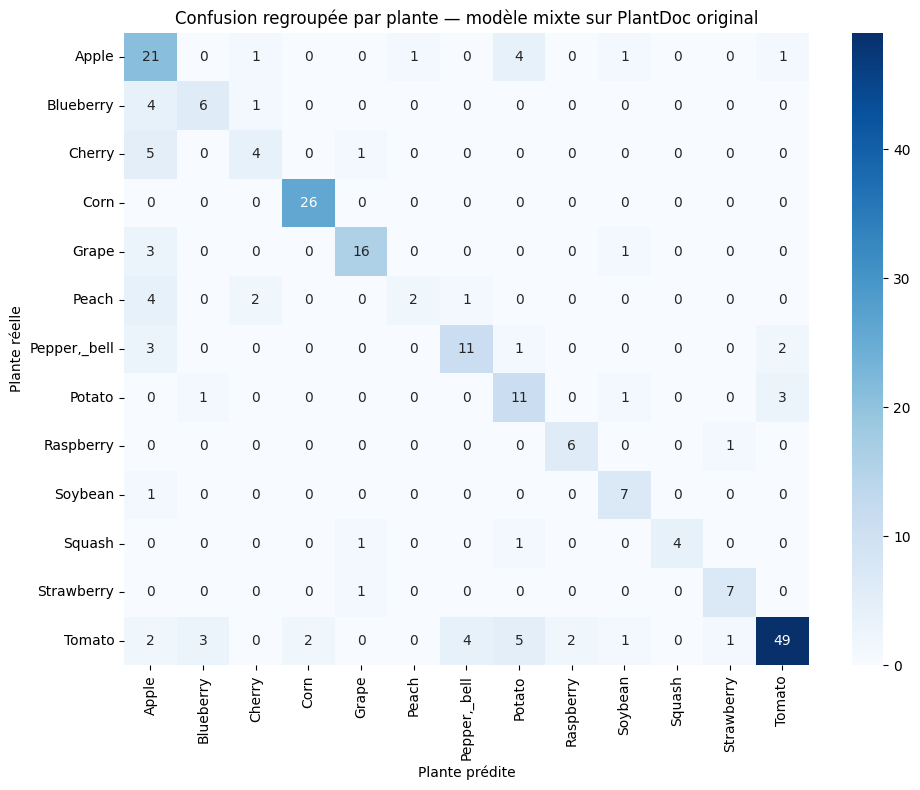

In [23]:
def plant_group_from_pv_label(label_name):
    return label_name.split('___', 1)[0]

plant_confusion_df = pd.DataFrame({
    'true_class': [class_names[i] for i in mixed_orig_true],
    'pred_class': [class_names[i] for i in mixed_orig_pred],
})
plant_confusion_df['true_plant'] = plant_confusion_df['true_class'].map(plant_group_from_pv_label)
plant_confusion_df['pred_plant'] = plant_confusion_df['pred_class'].map(plant_group_from_pv_label)
plant_confusion_df['plant_correct'] = plant_confusion_df['true_plant'] == plant_confusion_df['pred_plant']
plant_confusion_df['class_correct'] = plant_confusion_df['true_class'] == plant_confusion_df['pred_class']

plant_summary = (
    plant_confusion_df
    .groupby('true_plant')
    .agg(
        n=('true_plant', 'size'),
        plant_accuracy=('plant_correct', 'mean'),
        class_accuracy=('class_correct', 'mean'),
    )
    .sort_values('n', ascending=False)
)
display(plant_summary)
plant_summary.to_csv(SEGMENTATION_REPORT_DIR / 'mixed_model_plant_group_summary.csv')

plant_cm = pd.crosstab(plant_confusion_df['true_plant'], plant_confusion_df['pred_plant'])
plt.figure(figsize=(10, 8))
sns.heatmap(plant_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion regroupée par plante — modèle mixte sur PlantDoc original')
plt.xlabel('Plante prédite')
plt.ylabel('Plante réelle')
plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'mixed_model_plant_group_confusion.png', dpi=120)
plt.show()

## 16. Vérification 3 — Exemples d'erreurs

On inspecte des erreurs du modèle mixte sur PlantDoc original. Chaque ligne affiche l'image originale et, si disponible, sa version segmentée correspondante. Cela permet de voir si l'erreur vient plutôt du fond, du cadrage, d'une segmentation imparfaite ou d'une confusion visuelle entre maladies.

ERROR:asyncio:Task was destroyed but it is pending!
task: <Task pending name='Task-199' coro=<_async_in_context.<locals>.run_in_context() done, defined at /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/.venv/lib/python3.11/site-packages/ipykernel/utils.py:57> wait_for=<Task pending name='Task-200' coro=<Kernel.shell_main() running at /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/.venv/lib/python3.11/site-packages/ipykernel/kernelbase.py:597> cb=[Task.task_wakeup()]> cb=[ZMQStream._run_callback.<locals>._log_error() at /home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/.venv/lib/python3.11/site-packages/zmq/eventloop/zmqstream.py:563]>
/home/leonard/UQAC/8INF934 - Atelier Pratique IA I/Projet/AgroScan/.venv/lib/python3.11/site-packages/IPython/core/compilerop.py:86: RuntimeWarning: coroutine 'Kernel.shell_main' was never awaited
  return compile(source, filename, symbol, self.flags | PyCF_ONLY_AST, 1)
ERROR:asyncio:Task was destro

,true,pred,confidence
41,Peach___healthy,Cherry___healthy,0.958641
32,Cherry___healthy,Apple___healthy,0.948663
35,Corn___Northern_Leaf_Blight,Corn___Cercospora_leaf_spot Gray_leaf_spot,0.924477
37,Corn___Northern_Leaf_Blight,Corn___Common_rust,0.911630
110,Grape___Black_rot,Apple___Cedar_apple_rust,0.867748
113,Grape___Black_rot,Grape___healthy,0.854401
62,Strawberry___healthy,Grape___healthy,0.849627
20,"Pepper,_bell___Bacterial_spot",Apple___healthy,0.818564
53,Potato___Late_blight,Tomato___Late_blight,0.798879
22,Blueberry___healthy,Apple___healthy,0.783223


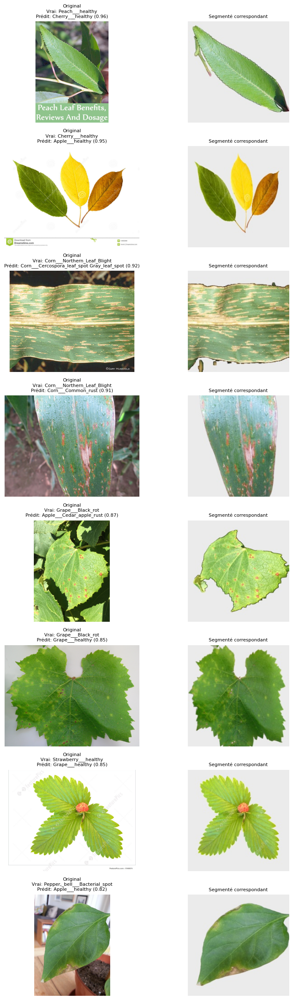

In [25]:
error_rows = []
for path, true_idx, pred_idx, conf in zip(orig_test_paths, mixed_orig_true, mixed_orig_pred, mixed_orig_conf):
    if int(true_idx) == int(pred_idx):
        continue
    path = Path(path)
    seg_candidate = seg_test_dir / path.parent.name / path.with_suffix('.jpg').name
    error_rows.append({
        'path': path,
        'seg_path': seg_candidate if seg_candidate.exists() else None,
        'true': class_names[int(true_idx)],
        'pred': class_names[int(pred_idx)],
        'confidence': float(conf),
    })

errors_df = pd.DataFrame(error_rows).sort_values('confidence', ascending=False)
display(errors_df[['true', 'pred', 'confidence']].head(20))
errors_df.assign(path=errors_df['path'].astype(str), seg_path=errors_df['seg_path'].astype(str)).to_csv(
    SEGMENTATION_REPORT_DIR / 'mixed_model_top_errors.csv',
    index=False,
)

n_show = min(8, len(errors_df))
fig, axes = plt.subplots(n_show, 2, figsize=(9, 3 * n_show))
if n_show == 1:
    axes = np.array([axes])

for row_idx, (_, row) in enumerate(errors_df.head(n_show).iterrows()):
    axes[row_idx, 0].imshow(Image.open(row['path']).convert('RGB'))
    title = f"Original\nVrai: {row['true']}\nPrédit: {row['pred']} ({row['confidence']:.2f})"
    axes[row_idx, 0].set_title(title, fontsize=8)
    axes[row_idx, 0].axis('off')

    if row['seg_path'] is not None and Path(row['seg_path']).exists():
        axes[row_idx, 1].imshow(Image.open(row['seg_path']).convert('RGB'))
        axes[row_idx, 1].set_title('Segmenté correspondant', fontsize=8)
    else:
        axes[row_idx, 1].text(0.5, 0.5, 'Segmenté indisponible', ha='center', va='center')
    axes[row_idx, 1].axis('off')

plt.tight_layout()
plt.savefig(SEGMENTATION_REPORT_DIR / 'mixed_model_error_examples.png', dpi=120)
plt.show()

## 17. Lecture des résultats

### Résultats observés sur PlantDoc

Les résultats sauvegardés dans `reports/segmentation/segmentation_mixed_final_results.json` montrent que la segmentation devient utile dès que le modèle est entraîné avec ce rendu.

| Expérience | Test | Accuracy | Macro F1 | Lecture |
|---|---:|---:|---:|---|
| Modèle jalon 4 original | PlantDoc original | 44,49 % | 42,20 % | Référence actuelle |
| Modèle jalon 4 original | PlantDoc segmenté | 44,49 % | 42,10 % | La segmentation seule ne suffit pas |
| Fine-tuning segmenté seul | PlantDoc segmenté | 52,12 % | 50,18 % | Meilleur score sur rendu segmenté |
| Fine-tuning original + segmenté | PlantDoc original | 51,69 % | 50,17 % | Meilleur choix si l'app reçoit des images originales |
| Fine-tuning original + segmenté | PlantDoc segmenté | 50,85 % | 45,23 % | Reste meilleur que le jalon 4 de référence |

La segmentation ne donne pas de gain immédiat si elle est appliquée seulement au test. Le modèle jalon 4 n'a pas appris ce type de rendu, donc ses performances restent quasiment identiques. En revanche, le fine-tuning sur des images segmentées ou mixtes apporte un gain net sur PlantDoc.

Le fine-tuning segmenté seul est le meilleur sur PlantDoc segmenté, mais il spécialise le modèle à ce rendu. Le fine-tuning mixte original + segmenté est plus intéressant pour le produit : il améliore PlantDoc original de **+7,20 points d'accuracy** et **+7,97 points de macro F1** par rapport au jalon 4, sans dépendre entièrement d'une segmentation parfaite.

### Vérification 1 — Robustesse hors PlantDoc

Le modèle mixte obtient :

| Dataset | Accuracy | Macro F1 | Lecture |
|---|---:|---:|---|
| PlantVillage test | 62,91 % | 54,06 % | Les connaissances PlantVillage restent partielles, mais il y a encore un oubli important |
| PlantWild val | 44,36 % | 39,14 % | Le modèle reste fragile sur données terrain intermédiaires |

Ce point limite la conclusion : le modèle mixte est meilleur sur PlantDoc, mais il ne doit pas être présenté comme un modèle globalement robuste. Il améliore le domaine ciblé, au prix d'une généralisation encore moyenne sur les autres datasets.

### Vérification 2 — Confusion par plante

La matrice regroupée par plante montre que le modèle reconnaît parfois bien la plante, mais confond encore les maladies à l'intérieur d'une même plante.

Exemples :

| Plante | n | Accuracy plante | Accuracy classe | Lecture |
|---|---:|---:|---:|---|
| Corn | 26 | 100,00 % | 69,23 % | La plante est reconnue, mais les maladies du maïs restent confondues |
| Grape | 20 | 80,00 % | 75,00 % | Bon comportement relatif |
| Tomato | 69 | 71,01 % | 33,33 % | Le modèle reconnaît souvent la tomate, mais distingue mal ses maladies |
| Potato | 16 | 68,75 % | 37,50 % | Confusion probable entre maladies proches ou entre plantes solanacées |
| Peach | 9 | 22,22 % | 22,22 % | Classe fragile, peu fiable |

Pour la suite, il faut donc analyser séparément deux problèmes : reconnaître la plante et reconnaître la maladie. Sur certaines familles, le modèle a déjà appris la plante, mais pas assez finement les symptômes.

### Vérification 3 — Exemples d'erreurs

Les erreurs les plus confiantes montrent plusieurs cas importants :

- `Peach___healthy` prédit `Cherry___healthy` avec forte confiance : confusion entre feuilles saines visuellement proches.
- `Cherry___healthy` prédit `Apple___healthy` : confusion inter-plantes sur feuilles simples.
- Plusieurs images `Corn___Northern_Leaf_Blight` sont prédites comme `Corn___Cercospora_leaf_spot Gray_leaf_spot` ou `Corn___Common_rust` : le modèle identifie bien le maïs, mais confond les maladies foliaires.
- `Potato___Late_blight` prédit `Tomato___Late_blight` : confusion cohérente entre plantes proches, avec maladie similaire.
- Certaines erreurs très confiantes restent inter-plantes, ce qui indique un problème de calibration et de représentation, pas seulement de fond.

Ces erreurs confirment que la segmentation aide à réduire le bruit visuel, mais ne résout pas entièrement la granularité fine des symptômes.

### Décision recommandée

Le meilleur candidat issu de cette expérience est :

```text
models/jalon4_original_segmented_plantdoc_ft.keras
```

C'est le meilleur compromis actuel pour le produit, car il améliore les images originales PlantDoc, c'est-à-dire le cas le plus proche des photos envoyées par l'application mobile.

### Suite proposée

1. Garder le modèle mixte original + segmenté comme candidat jalon 4.
2. Ne pas investir immédiatement dans une segmentation parfaite : le gain vient surtout du fine-tuning avec rendus variés.
3. Ajouter une analyse par plante/maladie dans la présentation, car c'est là que les limites sont les plus claires.
4. Tester un entraînement mixte plus large ensuite : PlantDoc original + PlantDoc segmenté + PlantWild, avec un petit replay PlantVillage pour limiter l'oubli.
5. Si le temps le permet, tester une pondération différente, par exemple 70 % original / 30 % segmenté, pour mieux préserver le cas mobile sans segmentation.

Conclusion actuelle : la segmentation est une piste valide pour le jalon 4, mais elle doit être utilisée comme augmentation/adaptation de domaine pendant l'entraînement. Le modèle mixte original + segmenté est le compromis le plus robuste à présenter, tout en restant honnête sur ses limites de généralisation.
